# Argo Data exploration

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import hvplot.xarray
import hvplot.pandas
import os
from tqdm import tqdm
import holoviews as hv
from geopy.distance import geodesic

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [2]:
central_caldera = (45.954681, -130.008896)
eastern_caldera = (45.939671, -129.973801)
midpoint = ((central_caldera[0] + eastern_caldera[0])/2, (central_caldera[1] + eastern_caldera[1])/2, )

In [17]:
months = np.arange(1,13)
years = np.arange(2015,2023)

temps = []
for year in years:
    print(f'combine {year}...')
    
    for month in tqdm(months):
        f_dir = f'/datadrive/ARGO/{year}/{month:02}/'
        fns = os.listdir(f_dir)

        for fn in fns:
            f_path = f'{f_dir}{fn}'
          
            # NEED TO FIX THIS
            try:
                ds = xr.open_dataset(f_path)
                # add lat/lon to coordinates
                ds = ds.assign_coords({'lon':ds['LONGITUDE'], 'lat':ds['LATITUDE']})
                ds = ds.set_index({'N_PROF':['lat','lon']})
                ds = ds.sortby(['lat', 'lon'])

                # slice ds
                ds_slice = ds.sel(N_PROF=(slice(44,48), slice(None, None))).sel(N_PROF=(slice(None, None), slice(-133,-127)))

                if ds_slice.sizes['N_PROF'] == 0:
                    continue
                else:
                    for k in range(ds_slice.sizes['N_PROF']):
                        temp = ds_slice['TEMP'].isel({'N_PROF':k}).assign_coords({'N_LEVELS':ds_slice['PRES'][k,:].values}).rename({'N_LEVELS':'pressure'})
                        temp = temp.dropna('pressure').sortby('pressure').interp(pressure=np.arange(0,1500)).mean()
                        temp = temp.assign_coords({'time':ds_slice['JULD'][0].values})
                        temps.append(temp)
            except:
                continue

combine 2015...


100%|█████████████████████████████████████████████████████████████████| 12/12 [00:45<00:00,  3.78s/it]


combine 2016...


100%|█████████████████████████████████████████████████████████████████| 12/12 [00:50<00:00,  4.24s/it]


combine 2017...


100%|█████████████████████████████████████████████████████████████████| 12/12 [01:06<00:00,  5.58s/it]


combine 2018...


100%|█████████████████████████████████████████████████████████████████| 12/12 [01:03<00:00,  5.28s/it]


combine 2019...


100%|█████████████████████████████████████████████████████████████████| 12/12 [01:06<00:00,  5.57s/it]


combine 2020...


100%|█████████████████████████████████████████████████████████████████| 12/12 [01:22<00:00,  6.89s/it]


combine 2021...


100%|█████████████████████████████████████████████████████████████████| 12/12 [00:47<00:00,  3.94s/it]


combine 2022...


100%|█████████████████████████████████████████████████████████████████| 12/12 [00:51<00:00,  4.29s/it]


In [18]:
tempsx = xr.concat(temps, dim='N_PROF')

In [19]:
lats = tempsx.lat
lons = tempsx.lon

distances = []
for k in range(len(tempsx)):
    distances.append(geodesic(midpoint, (lats[k], lons[k])).km)

In [29]:
fn = '/datadrive/HYCOM_data/Axial_Seamount_earthengine/*.nc'
HYCOM = xr.open_mfdataset(fn)

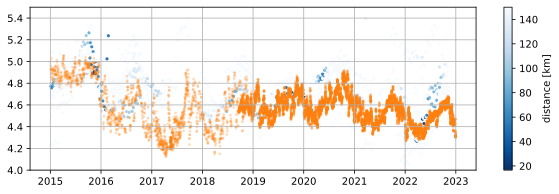

In [38]:
fig = plt.figure(figsize=(10,3))

plt.scatter(tempsx.time, tempsx.values, c=distances, vmax=150, cmap='Blues_r', s=10, lw=0)
plt.colorbar(label='distance [km]')

plt.scatter(HYCOM.time, HYCOM['temperature'].interp({'depth':np.arange(1500)}).mean('depth'), c='C1', s=7, lw=0, alpha=0.3)


plt.ylim(4,5.5)
plt.grid()

In [397]:
temps_ds = xr.Dataset({
    'temp':tempsx.drop(['time', 'lat', 'lon']),
    'time':tempsx.time.drop(['time', 'lat', 'lon']),
    'lat':tempsx.lat.drop(['time', 'lat', 'lon']),
    'lon':tempsx.lon.drop(['time', 'lat', 'lon']),
}).drop_vars('N_PROF')

In [398]:
fn = '/datadrive/ARGO/axial_seamount_avg_temp2.nc'
temps_ds.to_netcdf(fn)

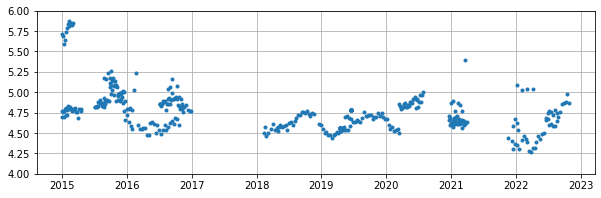

In [343]:
fig = plt.figure(figsize=(10,3))
plt.plot(temps_ds.time, temps_ds.temp, '.')
plt.ylim([4,6])
plt.grid()

### compare to HYCOM

In [399]:
fn = '/datadrive/HYCOM_data/Axial_Seamount_earthengine/*.nc'
temp = xr.open_mfdataset(fn)['temperature']
temp.loc[pd.Timestamp('2018-02-27 T00:00:00')] = np.ones(40)*np.nan
temp.loc[pd.Timestamp('2020-09-21 T21:00:00')] = np.ones(40)*np.nan

In [400]:
temp = temp.interp({'time':pd.date_range(pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01'), freq='1D')})

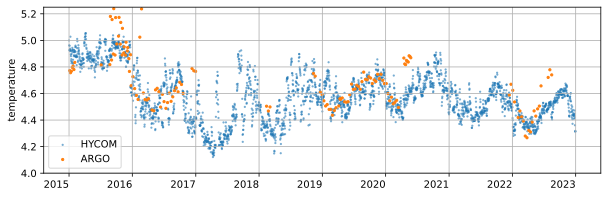

In [402]:
sns.reset_defaults()
fig = plt.figure(figsize=(10,3))

temp.interp({'depth':np.arange(0,1500)}).mean('depth').plot.scatter(label='HYCOM', lw=0, s=5, c='C0', alpha=0.6)

plt.scatter(temps_ds.time, temps_ds.temp, label='ARGO', c='C1', s=5,)

plt.ylim([4,5.25])
plt.grid()
plt.xlabel('')
plt.legend(loc='lower left')
#plt.ylabel('temperature [$^\circ$C]')
_ = plt.xticks(rotation=0)

# World Atlas Ocean

In [56]:
fn = '/datadrive/woa/woa23_decav91C0_t01_04.nc'
woa = xr.open_dataset(fn, decode_times=False)

In [71]:
woa['t_se']

<xarray.DataArray 't_se' (time: 1, depth: 57, lat: 720, lon: 1440)>
[59097600 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 -179.9 -179.6 -179.4 -179.1 ... 179.4 179.6 179.9
  * depth    (depth) float32 0.0 5.0 10.0 15.0 ... 1.4e+03 1.45e+03 1.5e+03
  * time     (time) float32 168.5
Attributes:
    standard_name:  sea_water_temperature standard_error
    long_name:      The standard error about the statistical mean of sea_wate...
    cell_methods:   area: mean depth: mean time: mean
    grid_mapping:   crs
    units:          degrees_celsius

In [63]:
woa.isel({'time':0})['t_an'].hvplot(x='lon', y='lat', cmap='inferno', rasterize=True, alpha=0.3)

:DynamicMap   [depth]
   :Image   [lon,lat]   (t_an)

(1550.0, 10.0)

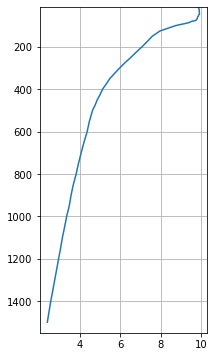

In [90]:
fig = plt.figure(figsize=(3,6))
woa_slice = woa.sel({'lat':45.9471, 'lon':-129.99, 'time':168}, method='nearest')

plt.plot(woa_slice['t_an'], woa.depth)

plt.fill_betweenx(woa.depth, woa_slice['t_an'] - woa_slice['t_se']/2, woa_slice['t_an'] + woa_slice['t_se']/2)
plt.grid()
plt.ylim([1550,10])

In [96]:
woa_slice

<xarray.Dataset>
Dimensions:             (nbounds: 2, depth: 57)
Coordinates:
    lat                 float32 45.88
    lon                 float32 -129.9
  * depth               (depth) float32 0.0 5.0 10.0 ... 1.45e+03 1.5e+03
    time                float32 168.5
Dimensions without coordinates: nbounds
Data variables: (12/13)
    crs                 int32 -2147483647
    lat_bnds            (nbounds) float32 45.75 46.0
    lon_bnds            (nbounds) float32 -130.0 -129.8
    depth_bnds          (depth, nbounds) float32 0.0 2.5 ... 1.475e+03 1.5e+03
    climatology_bounds  (nbounds) float32 0.0 349.0
    t_an                (depth) float32 9.772 9.817 9.841 ... 2.556 2.47 2.384
    ...                  ...
    t_dd                (depth) float64 1.0 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0
    t_sd                (depth) float32 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
    t_se                (depth) float32 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
    t_oa                (depth) float32 -0.4094 -0.04139 -0.06877 ... nan nan
    t_ma                (depth) float32 -2.947 -2.858 ... -0.02232 -0.0263
    t_gp                (depth) float64 137.0 126.0 137.0 ... 75.0 75.0 64.0
Attributes: (12/45)
    Conventions:                     CF-1.6
    title:                           World Ocean Atlas 2023 : sea_water_tempe...
    summary:                         Climatological mean temperature for the ...
    references:                      Locarnini, R. A., O. K. Baranova, A. V. ...
    institution:                     NOAA National Centers for Environmental ...
    comment:                         Global Climatology as part of the World ...
    ...                              ...
    ncei_template_version:           NCEI_NetCDF_Grid_Template_v1.0
    license:                         These data are openly available to the p...
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    metadata_link:                   https://www.ncei.noaa.gov/products/world...
    date_created:                    2022-09-29 
    date_modified:                   2022-09-29

In [94]:
woa_slice

<xarray.Dataset>
Dimensions:             (nbounds: 2, depth: 57)
Coordinates:
    lat                 float32 45.88
    lon                 float32 -129.9
  * depth               (depth) float32 0.0 5.0 10.0 ... 1.45e+03 1.5e+03
    time                float32 168.5
Dimensions without coordinates: nbounds
Data variables: (12/13)
    crs                 int32 -2147483647
    lat_bnds            (nbounds) float32 45.75 46.0
    lon_bnds            (nbounds) float32 -130.0 -129.8
    depth_bnds          (depth, nbounds) float32 0.0 2.5 ... 1.475e+03 1.5e+03
    climatology_bounds  (nbounds) float32 0.0 349.0
    t_an                (depth) float32 9.772 9.817 9.841 ... 2.556 2.47 2.384
    ...                  ...
    t_dd                (depth) float64 ...
    t_sd                (depth) float32 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
    t_se                (depth) float32 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
    t_oa                (depth) float32 ...
    t_ma                (depth) float32 ...
    t_gp                (depth) float64 ...
Attributes: (12/45)
    Conventions:                     CF-1.6
    title:                           World Ocean Atlas 2023 : sea_water_tempe...
    summary:                         Climatological mean temperature for the ...
    references:                      Locarnini, R. A., O. K. Baranova, A. V. ...
    institution:                     NOAA National Centers for Environmental ...
    comment:                         Global Climatology as part of the World ...
    ...                              ...
    ncei_template_version:           NCEI_NetCDF_Grid_Template_v1.0
    license:                         These data are openly available to the p...
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    metadata_link:                   https://www.ncei.noaa.gov/products/world...
    date_created:                    2022-09-29 
    date_modified:                   2022-09-29